In [1]:

import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
os.environ["CUDA_VISIBLE_DEVICES"]= "1"


In [2]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from typing import Optional
import numpy

def _to_numpy_image(img) -> "numpy.ndarray":
    try:
        import numpy as np
    except ImportError:
        raise ImportError("需要 numpy 来显示原图")
    if isinstance(img, torch.Tensor):
        x = img.detach().cpu()
        if x.dim() == 3 and x.shape[0] in (1, 3):  # CHW -> HWC
            x = x.permute(1, 2, 0)
        x = x.float().clamp(0.0, 1.0).numpy()
        return x
    elif hasattr(img, "__array__"):
        x = img
        x = x.astype("float32") if hasattr(x, "astype") else x
        return x
    else:
        raise TypeError("orig_image 需要是 Tensor 或 numpy 数组")

# 示例：
# sim = visualize_dec_in_self_similarity(dec_in_feats, row=5, col=7, orig_image=dec_in_img, mask_self=True)



In [3]:
import sys
import torch
from pathlib import Path

# 添加项目路径
project_root = Path.cwd()
sys.path.append(str(project_root))

from latent_action_model.genie.dataset import LightningOpenX


2025-12-11 14:30:43.300425: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-11 14:30:43.343246: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-12-11 14:30:43.343273: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-12-11 14:30:43.344455: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-12-11 14:30:43.351711: I tensorflow/core/platform/cpu_feature_guar

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
from typing import Optional


def visualize_self_similarity(
    dec_in_feats,
    index: Optional[int] = None,
    row: Optional[int] = None,
    col: Optional[int] = None,
    *,
    orig_image: Optional[object] = None,
    mask_self: bool = False,
    cmap: str = "coolwarm",
    vmin: Optional[float] = -1.0,
    vmax: Optional[float] = 1.0,
    title: Optional[str] = None,
    show_colorbar: bool = True,
    orig_title: str = "Original",
) -> "torch.Tensor":
    if dec_in_feats.dim() != 3:
        raise ValueError("dec_in_feats 需要是 [dim, H, W] 张量")

    dim, H, W = dec_in_feats.shape

    if index is not None:
        row = int(index) // W
        col = int(index) % W
    if row is None or col is None:
        raise ValueError("需要提供 index 或 (row, col) 其中之一")
    if not (0 <= row < H and 0 <= col < W):
        raise ValueError(f"(row, col)=({row}, {col}) 超出范围 H={H}, W={W}")

    feats = F.normalize(dec_in_feats, p=2, dim=0)
    anchor = feats[:, row, col]
    sim_map = (feats * anchor.view(dim, 1, 1)).sum(dim=0).detach().cpu()

    if mask_self:
        sim_map[row, col] = float("nan")

    if orig_image is None:
        plt.figure(figsize=(5, 5))
        ax = plt.gca()
        im = ax.imshow(sim_map.numpy(), cmap=cmap, vmin=vmin, vmax=vmax)
        ax.scatter([col], [row], s=60, facecolors="none", edgecolors="black", linewidths=1.5)
        ax.set_xlabel("w_patches")
        ax.set_ylabel("h_patches")
        if title is None:
            title = f"Intra dec_in similarity — (row={row}, col={col}, idx={row * W + col})"
        ax.set_title(title)
        if show_colorbar:
            plt.colorbar(im, ax=ax)
    else:
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        # 左：原图（坐标映射到 patch 网格坐标）
        img_np = _to_numpy_image(orig_image)
        axes[0].imshow(img_np, extent=[0, W, H, 0])
        axes[0].scatter([col + 0.5], [row + 0.5], s=60, facecolors="none", edgecolors="red", linewidths=1.5)
        axes[0].set_title(orig_title)
        axes[0].set_xlim(0, W)
        axes[0].set_ylim(H, 0)
        axes[0].set_xticks([])
        axes[0].set_yticks([])
        # 右：热图
        im = axes[1].imshow(sim_map.numpy(), cmap=cmap, vmin=vmin, vmax=vmax)
        axes[1].scatter([col], [row], s=60, facecolors="none", edgecolors="red", linewidths=1.5)
        axes[1].set_xlabel("w_patches")
        axes[1].set_ylabel("h_patches")
        if title is None:
            title = f"Intra dec_in similarity — (row={row}, col={col}, idx={row * W + col})"
        axes[1].set_title(title)
        if show_colorbar:
            fig.colorbar(im, ax=axes[1])
    plt.tight_layout()
    plt.show()
    plt.close()

    return sim_map


def visualize_cross_image_similarity(
    src_feats,
    dst_feats,
    src_index: Optional[int] = None,
    src_row: Optional[int] = None,
    src_col: Optional[int] = None,
    *,
    src_image: Optional[object] = None,
    dst_image: Optional[object] = None,
    cmap: str = "coolwarm",
    vmin: Optional[float] = -1.0,
    vmax: Optional[float] = 1.0,
    title: Optional[str] = None,
    show_colorbar: bool = False,
    src_title: str = "Source",
    dst_title: str = "Target",
    overlay_on_dst: bool = False,
) -> "torch.Tensor":
    if src_feats.dim() != 3 or dst_feats.dim() != 3:
        raise ValueError("src_feats 和 dst_feats 都需要是 [dim, H, W] 张量")

    dim_s, Hs, Ws = src_feats.shape
    dim_t, Ht, Wt = dst_feats.shape
    if dim_s != dim_t:
        raise ValueError(f"特征维不一致: src dim={dim_s}, dst dim={dim_t}")

    if src_index is not None:
        src_row = int(src_index) // Ws
        src_col = int(src_index) % Ws
    if src_row is None or src_col is None:
        raise ValueError("需要提供 src_index 或 (src_row, src_col) 其中之一")
    if not (0 <= src_row < Hs and 0 <= src_col < Ws):
        raise ValueError(f"(src_row, src_col)=({src_row}, {src_col}) 超出范围 Hs={Hs}, Ws={Ws}")

    src_feats_n = F.normalize(src_feats, p=2, dim=0)
    dst_feats_n = F.normalize(dst_feats, p=2, dim=0)

    anchor = src_feats_n[:, src_row, src_col]
    sim_map_tgt = (dst_feats_n * anchor.view(dim_s, 1, 1)).sum(dim=0).detach().cpu()

    if overlay_on_dst and (dst_image is not None):
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        # 源原图（映射到 patch 网格坐标并标点）
        if src_image is not None:
            axes[0].imshow(_to_numpy_image(src_image), extent=[0, Ws, Hs, 0])
            axes[0].scatter([src_col + 0.5], [src_row + 0.5], s=60, facecolors="none", edgecolors="red", linewidths=1.5)
            axes[0].set_xlim(0, Ws)
            axes[0].set_ylim(Hs, 0)
            axes[0].set_xticks([])
            axes[0].set_yticks([])
        axes[0].set_title(src_title)
        # 目标原图 + 热图
        axes[1].imshow(_to_numpy_image(dst_image))
        im = axes[1].imshow(sim_map_tgt.numpy(), cmap=cmap, vmin=vmin, vmax=vmax, alpha=0.8)
        if title is None:
            title = f"Cross similarity — src(row={src_row}, col={src_col}) -> target"
        axes[1].set_title(title)
        axes[1].set_xlabel("w_patches")
        axes[1].set_ylabel("h_patches")
        if show_colorbar:
            fig.colorbar(im, ax=axes[1])
    else:
        num_imgs = int(src_image is not None) + int(dst_image is not None)
        cols = max(1, num_imgs + 1)
        fig, axes = plt.subplots(1, cols, figsize=(5 * cols, 5))
        ax_list = axes.flatten().tolist() if isinstance(axes, np.ndarray) else ([axes] if not isinstance(axes, (list, tuple)) else list(axes))
        idx = 0
        if src_image is not None:
            ax_list[idx].imshow(_to_numpy_image(src_image), extent=[0, Ws, Hs, 0])
            ax_list[idx].scatter([src_col + 0.5], [src_row + 0.5], s=60, facecolors="none", edgecolors="red", linewidths=1.5)
            ax_list[idx].set_xlim(0, Ws)
            ax_list[idx].set_ylim(Hs, 0)
            ax_list[idx].set_xticks([])
            ax_list[idx].set_yticks([])
            ax_list[idx].set_title(src_title)
            idx += 1
        if dst_image is not None:
            ax_list[idx].imshow(_to_numpy_image(dst_image))
            ax_list[idx].set_title(dst_title)
            ax_list[idx].axis('off')
            idx += 1
        im = ax_list[idx].imshow(sim_map_tgt.numpy(), cmap=cmap, vmin=vmin, vmax=vmax)
        if title is None:
            title = f"Cross similarity — src(row={src_row}, col={src_col}) -> target"
        ax_list[idx].set_title(title)
        ax_list[idx].set_xlabel("w_patches")
        ax_list[idx].set_ylabel("h_patches")
        if show_colorbar:
            fig.colorbar(im, ax=ax_list[idx])
    plt.tight_layout()
    plt.show()
    plt.close()

    return sim_map_tgt



In [1]:
import json
import os
from dataclasses import dataclass, field, asdict
from pathlib import Path
from typing import Optional, Tuple, Union, Dict, Any
from datetime import datetime

import torch
import torch.distributed as dist
import yaml
from latent_action_model.core.lam_model import load_latent_action_model
from prismatic.overwatch import initialize_overwatch
from prismatic.util import set_global_seed
from prismatic.vla import get_latent_vla_dataset_and_collator
from prismatic.vla.datasets.datasets import RLDSDataset
from prismatic.models import load_InternVL,freeze_internvl
from prismatic.vla.datasets.rlds.utils.data_utils import save_dataset_statistics
from typing import cast
from prismatic.training.accelerate_fsdp_trainer import run_latent_action_training
from prismatic.vla.latent_vla_model import LatentVLAModel
from transformers import AutoProcessor

# Sane Defaults
os.environ["TOKENIZERS_PARALLELISM"] = "false"
os.environ.setdefault("PYTORCH_CUDA_ALLOC_CONF", "expandable_segments:True")


# Initialize Overwatch =>> Wraps `logging.Logger`
overwatch = initialize_overwatch(__name__)

# 📝 动作 token 列表: ['<ACT_0>', '<ACT_1>', '<ACT_2>', '<ACT_3>', '<ACT_4>', '<ACT_5>', '<ACT_6>', '<ACT_7>', '<ACT_8>', '<ACT_9>', '<ACT_10>', '<ACT_11>', '<ACT_12>', '<ACT_13>', '<ACT_14>', '<ACT_15>']
# 🔢 对应的 token ID: [151679, 151680, 151681, 151682, 151683, 151684, 151685, 151686, 151687, 151688, 151689, 151690, 151691, 151692, 151693, 151694]
# 🎯 action_token_begin_id = 151679
# 📊 ID 范围: 151679 - 151694
home_path = "/mnt/project_rlinf/jlchen"

@dataclass
class TrainConfig:
    # fmt: off

    # =========================
    # 路径与资源
    # =========================
    # Directory Paths
    data_root_dir: Path = Path(home_path + "/datasets")
    run_root_dir: Path = Path("vla_log")    # Store logs & checkpoints under vla_scripts/

    # Hugging Face 模型标识（或本地权重目录）；用于 PrismaticVLM.from_pretrained()
    # model_id: str = home_path + "/weights/InternVL3_5-1B-Instruct-HF"
    model_id: str = home_path + "/weights/Qwen3-VL-2B-Instruct"
    hf_cache_dir: Optional[Path] = None
    # =========================
    # 数据与预处理
    # =========================
    # 数据混合与缓冲
    data_mix: str = "lam_plus"
    training_phase: str = "pre-training"
    shuffle_buffer_size: int = 2000
    image_aug: bool = True                                          # Whether to enable image augmentations
    # DataLoader
    dataloader_num_workers: int = 0
    dataloader_pin_memory: bool = True

    # =========================
    # 模型冻结策略
    # =========================
    # 冻结策略
    freeze_vision_backbone: bool = False
    freeze_llm_backbone: bool = False
    freeze_last_llm_layer: bool = False
    freeze_projector: bool = False

    # =========================
    # LAM / 动作离散参数
    # =========================
    latent_action_placeholder_token: str = "<ACT_PH>"
    enable_lam_encoder_distill: bool = False
    enable_lam_decoder_perceptual: bool = False
    lam_encoder_distill_weight: float = 1.0
    lam_decoder_perceptual_weight: float = 0.0
    new_token_lr_scale: float = 1.0  # 对新增 special tokens 的 embedding 梯度放大倍数（>1 放大，=1 不变）
    use_latent_vla_model: bool = True

    # =========================
    # 训练设置
    # =========================
    # 训练超参
    debug_repeat_batch: bool = False
    epochs: Optional[int] = 10
    max_steps: Optional[int] = 20000  #以max_steps为准，若为空则按epochs * 10000近似
    per_device_batch_size: int = 256
    gradient_accumulation_steps: int = 1
    learning_rate: float = 2e-3
    warmup_steps: int = 1000
    weight_decay: float = 0.0
    max_grad_norm: float = 1.0
    lr_scheduler_type: str = "constant"   #constant_with_warmup
    optim: str = "adamw_torch"
    # 训练加速
    enable_mixed_precision_training: bool = True
    seed: int = 42                                                  # Random seed (for reproducibility)
    logging_steps: int = 1

    # =========================
    # 评估与保存
    # =========================
    eval_strategy: str = "steps"
    save_total_limit: int = -1
    eval_interval: int = 4
    eval_accumulation_steps: int = 1
    per_device_eval_batch_size: int = 128
    save_interval: int = 1000                                    # Interval for saving checkpoints (in steps

    # =========================
    # 分布式 / FSDP
    # =========================
    fsdp: Optional[str] = "full_shard"                     # 示例："full_shard auto_wrap" 或 None 关闭
    fsdp_config: Optional[Dict[str, Any]] = None   # 示例：{"fsdp_min_num_params": 1e7, "xla": False}

    # =========================
    # 运行与日志
    # =========================
    # Run Arguments
    run_id: Optional[str] = None                                  # Run ID for logging, Weights & Biases
    run_id_note: Optional[str] = "run_01"                               # Extra note for logging, Weights & Biases
    # Tracking Parameters
    wandb_project: str = "vla_pretraining"                   # Name of W&B project to log to (use default!)
    wandb_entity: Optional[str] = None                              # Name of entity to log under

    # =========================
    # 恢复 / 断点（仅用于日志标记，不再用于模型权重加载）
    # =========================
    # Resume (logging) Parameters -- 仅用于日志标记，不再用于模型权重加载
    resume_step: Optional[int] = None
    resume_epoch: Optional[int] = None

    # =========================
    # HF Hub 凭据（如有门限模型）
    # =========================
    # HF Hub Credentials (for any gated models)
    hf_token: Optional[str] = None

    # fmt: on

cfg = TrainConfig()

overwatch.info("OpenVLA Training :: Warming Up")


# 加载 processor 用于数据处理
processor = AutoProcessor.from_pretrained(cfg.model_id, trust_remote_code=True)
tokenizer = processor.tokenizer
special_tokens_dict = {"additional_special_tokens": [f"<ACT_{i}>" for i in range(32)]}
try:
    tokenizer.add_special_tokens(special_tokens_dict)  # type: ignore[attr-defined]
except Exception:
    pass
placeholder_token = getattr(cfg, "latent_action_placeholder_token", "<ACT_PH>")
try:
    tokenizer.add_special_tokens({"additional_special_tokens": [placeholder_token]})  # type: ignore[attr-defined]
except Exception:
    pass
# 获取 placeholder_token_id
tokenizer = processor.tokenizer
# placeholder_token_id = tokenizer.convert_tokens_to_ids(cfg.latent_action_placeholder_token)


train_dataset, val_dataset, collator = get_latent_vla_dataset_and_collator(
    cfg.data_root_dir,
    cfg.data_mix,
    processor=processor,
    shuffle_buffer_size=cfg.shuffle_buffer_size,
    image_aug=cfg.image_aug,
    training_phase=cfg.training_phase,
    latent_action_num_queries=4,
    debug_repeat_batch=cfg.debug_repeat_batch,
    target_seq_len=200
)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Val dataset size: {len(val_dataset)}")

# 创建 DataLoader
from torch.utils.data import DataLoader

train_loader = DataLoader(
    train_dataset,
    batch_size=cfg.per_device_batch_size,
    collate_fn=collator,
    num_workers=0,
    persistent_workers=False,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=cfg.per_device_batch_size,
    collate_fn=collator,
    num_workers=0,
    persistent_workers=False,
)

print(f"Train dataloader created with batch size: {cfg.per_device_batch_size}")
print(f"Val dataloader created with batch size: {cfg.per_device_batch_size}")




2025-12-20 21:06:59.125622: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-20 21:06:59.170855: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-12-20 21:06:59.170881: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-12-20 21:06:59.172813: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-12-20 21:06:59.180676: I tensorflow/core/platform/cpu_feature_guar


######################################################################################
# Loading the following 7 datasets (incl. sampling weight):                         #
# libero_90_rlds: ==========================================================0.039610 #
# droid: ===================================================================0.372874 #
# bridge_dataset: ==========================================================0.147214 #
# fractal20220817_data: ====================================================0.391538 #
# taco_play: ===============================================================0.008197 #
# jaco_play: ===============================================================0.002687 #
# ego4d: ===================================================================0.037881 #
######################################################################################



Load dataset info from /mnt/project_rlinf/jlchen/datasets/droid/1.0.0
Constructing tf.data.Dataset r2d2_faceblur for split train[:95%], from /mnt/project_rlinf/jlchen/datasets/droid/1.0.0
2025-12-20 21:07:22.510246: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
Load dataset info from /mnt/project_rlinf/jlchen/datasets/bridge_dataset/1.0.0
Constructing tf.data.Dataset bridge_dataset for split train, from /mnt/project_rlinf/jlchen/datasets/bridge_dataset/1.0.0
2025-12-20 21:07:23.075049: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
Load dataset info from /mnt/project_rlinf/jlchen/datasets/fractal20220817_data/1.0.0
Constructing tf.data.Dataset fractal20220817_data for split train[:95%], from /mnt/project_rlinf/jlchen/datasets/fractal20220817_data/1.0.0
2025-12-20 21:07:23.727175: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replica


######################################################################################
# Loading the following 7 datasets (incl. sampling weight):                         #
# libero_90_rlds: ==========================================================0.039610 #
# droid: ===================================================================0.372874 #
# bridge_dataset: ==========================================================0.147214 #
# fractal20220817_data: ====================================================0.391538 #
# taco_play: ===============================================================0.008197 #
# jaco_play: ===============================================================0.002687 #
# ego4d: ===================================================================0.037881 #
######################################################################################



Load dataset info from /mnt/project_rlinf/jlchen/datasets/droid/1.0.0
Constructing tf.data.Dataset r2d2_faceblur for split train[95%:], from /mnt/project_rlinf/jlchen/datasets/droid/1.0.0
2025-12-20 21:07:31.257881: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
Load dataset info from /mnt/project_rlinf/jlchen/datasets/bridge_dataset/1.0.0
Constructing tf.data.Dataset bridge_dataset for split val, from /mnt/project_rlinf/jlchen/datasets/bridge_dataset/1.0.0
2025-12-20 21:07:31.770149: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
Load dataset info from /mnt/project_rlinf/jlchen/datasets/fractal20220817_data/1.0.0
Constructing tf.data.Dataset fractal20220817_data for split train[95%:], from /mnt/project_rlinf/jlchen/datasets/fractal20220817_data/1.0.0
2025-12-20 21:07:32.418360: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate

Train dataset size: 14505878
Val dataset size: 2000
Train dataloader created with batch size: 256
Val dataloader created with batch size: 256


In [6]:
import torch
import matplotlib.pyplot as plt
from typing import List, Sequence

# ImageNet normalization constants
IMAGENET_MEAN: List[float] = [0.485, 0.456, 0.406]
IMAGENET_STD: List[float] = [0.229, 0.224, 0.225]


def denorm_for_vis(img_chw: torch.Tensor,
                   mean: Sequence[float] = IMAGENET_MEAN,
                   std: Sequence[float] = IMAGENET_STD) -> torch.Tensor:
    """将标准化图像还原到 [0,1] 区间。"""
    mean_t = torch.as_tensor(mean, dtype=img_chw.dtype, device=img_chw.device).view(-1, 1, 1)
    std_t = torch.as_tensor(std, dtype=img_chw.dtype, device=img_chw.device).view(-1, 1, 1)
    img = img_chw * std_t + mean_t
    return img.clamp(0.0, 1.0)


def visualize_batch_videos(batch: dict,
                           num_samples: int = 10,
                           num_frames: int = 10,
                           figsize: tuple[int, int] = (24, 16),
                           dpi: int = 200,
                           denorm: bool = False,
                           mean: Sequence[float] = IMAGENET_MEAN,
                           std: Sequence[float] = IMAGENET_STD) -> None:
    """
    可视化 batch 中的视频样本，每行一个样本的多帧序列。

    Args:
        batch: 包含 'videos' 键的字典，形状为 [B, T, C, H, W]
        num_samples: 要展示的样本数量
        num_frames: 每个样本展示的帧数（从头开始）
        figsize: 图像整体大小
        dpi: 图像分辨率
        denorm: 是否执行反标准化
    """
    videos = batch["videos"]
    videos = torch.cat([videos, batch["dec_videos"][:,:1],batch["dec_videos"][:,-1:]], dim=1)
    B, T, C, H, W = videos.shape

    num_samples = min(num_samples, B)
    num_frames = min(num_frames, T)

    fig, axes = plt.subplots(num_samples, num_frames, figsize=figsize, dpi=dpi)

    if num_samples == 1:
        axes = axes[None, :]
    if num_frames == 1:
        axes = axes[:, None]

    for i in range(num_samples):
        for j in range(num_frames):
            frame_chw = videos[i, j]
            if denorm:
                frame_chw = denorm_for_vis(frame_chw, mean, std)
            frame_hwc = frame_chw.permute(1, 2, 0).cpu().numpy()

            ax = axes[i, j]
            ax.imshow(frame_hwc)
            ax.axis("off")

            if i == 0:
                ax.set_title(f"Frame {j}", fontsize=10)
        axes[i, 0].set_ylabel(f"Sample {i}", fontsize=10)

    plt.tight_layout()
    plt.show()
    plt.close()


In [54]:
batch = next(iter(train_loader))
print(batch["videos"].shape)

torch.Size([128, 2, 3, 256, 256])


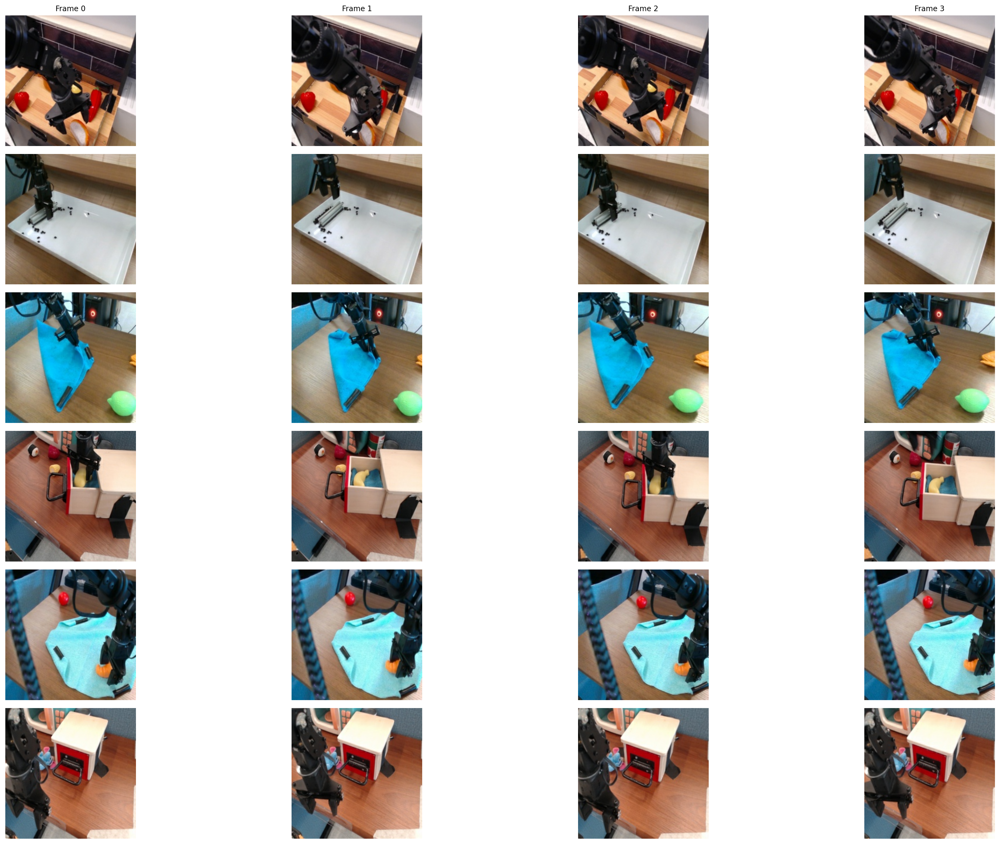

In [55]:

visualize_batch_videos(batch, num_samples=6,denorm=True)

In [9]:
from latent_action_model.core.vjepa_encoder import DINOv3Encoder
from transformers import AutoImageProcessor, AutoModel
import torch.nn.functional as F

path="/mnt/project_rlinf/jlchen/weights/dinov3-vitb16-pretrain-lvd1689m" 
# path="/mnt/project_rlinf/jlchen/weights/dinov3-vitb16-pretrain-lvd1689m" 

# 测试不同的norm方式
videos = batch["videos"].to("cuda")
dec_videos = batch["dec_videos"].to("cuda")

print("=" * 80)
print("测试不同norm方式对DINO特征的影响 - 比较videos[:,0]与videos[:,-1]的差值")
print("=" * 80)

# 1. 无norm
print("\n1. 无norm:")
dino_no_norm = DINOv3Encoder(path, enable_norm=False)
features_no_norm = dino_no_norm.encode(videos, n=-2)
dec_in_no_norm = features_no_norm[:, 0]  # [B, K, D]
tgt_no_norm = features_no_norm[:, -1]    # [B, K, D]
diff_abs_no_norm = (tgt_no_norm - dec_in_no_norm).abs()
diff_mean_no_norm = diff_abs_no_norm.mean()
diff_var_no_norm = diff_abs_no_norm.var()
print(f"  dec_in shape: {dec_in_no_norm.shape}")
print(f"  差值绝对值均值: {diff_mean_no_norm:.6f}")
print(f"  差值绝对值方差: {diff_var_no_norm:.6f}")

# 2. L2 norm
print("\n2. L2 norm:")
dino_l2 = DINOv3Encoder(path, enable_norm=True, norm_layer_type="l2")
features_l2 = dino_l2.encode(videos, n=-2)
dec_in_l2 = features_l2[:, 0]
tgt_l2 = features_l2[:, -1]
diff_abs_l2 = (tgt_l2 - dec_in_l2).abs()
diff_mean_l2 = diff_abs_l2.mean()
diff_var_l2 = diff_abs_l2.var()
print(f"  dec_in shape: {dec_in_l2.shape}")
print(f"  差值绝对值均值: {diff_mean_l2:.6f}")
print(f"  差值绝对值方差: {diff_var_l2:.6f}")

# 3. LayerNorm
print("\n3. LayerNorm:")
dino_ln = DINOv3Encoder(path, enable_norm=True, norm_layer_type="ln")
features_ln = dino_ln.encode(videos, n=-2)
dec_in_ln = features_ln[:, 0]
tgt_ln = features_ln[:, -1]
diff_abs_ln = (tgt_ln - dec_in_ln).abs()
diff_mean_ln = diff_abs_ln.mean()
diff_var_ln = diff_abs_ln.var()
print(f"  dec_in shape: {dec_in_ln.shape}")
print(f"  差值绝对值均值: {diff_mean_ln:.6f}")
print(f"  差值绝对值方差: {diff_var_ln:.6f}")

# 4. BatchNorm
print("\n4. BatchNorm:")
dino_bn = DINOv3Encoder(path, enable_norm=True, norm_layer_type="bn")
features_bn = dino_bn.encode(videos, n=-2)
dec_in_bn = features_bn[:, 0]
tgt_bn = features_bn[:, -1]
diff_abs_bn = (tgt_bn - dec_in_bn).abs()
diff_mean_bn = diff_abs_bn.mean()
diff_var_bn = diff_abs_bn.var()
print(f"  dec_in shape: {dec_in_bn.shape}")
print(f"  差值绝对值均值: {diff_mean_bn:.6f}")
print(f"  差值绝对值方差: {diff_var_bn:.6f}")

# 5. 手动标准化 (mean=0, std=1)
print("\n5. 手动标准化 (mean=0, std=1):")
features_manual = features_no_norm.clone()
features_manual = (features_manual - features_manual.mean(dim=-1, keepdim=True)) / features_manual.std(dim=-1, keepdim=True)
dec_in_manual = features_manual[:, 0]
tgt_manual = features_manual[:, -1]
diff_abs_manual = (tgt_manual - dec_in_manual).abs()
diff_mean_manual = diff_abs_manual.mean()
diff_var_manual = diff_abs_manual.var()
print(f"  dec_in shape: {dec_in_manual.shape}")
print(f"  差值绝对值均值: {diff_mean_manual:.6f}")
print(f"  差值绝对值方差: {diff_var_manual:.6f}")

print("\n" + "=" * 80)
print("总结: 不同norm方式下videos[:,0]与videos[:,-1]的差值统计")
print("=" * 80)
print(f"{'方法':<15} {'绝对值均值':<15} {'绝对值方差':<15}")
print("-" * 80)
print(f"{'无norm':<15} {diff_mean_no_norm:<15.6f} {diff_var_no_norm:<15.6f}")
print(f"{'L2 norm':<15} {diff_mean_l2:<15.6f} {diff_var_l2:<15.6f}")
print(f"{'LayerNorm':<15} {diff_mean_ln:<15.6f} {diff_var_ln:<15.6f}")
print(f"{'BatchNorm':<15} {diff_mean_bn:<15.6f} {diff_var_bn:<15.6f}")
print(f"{'手动标准化':<15} {diff_mean_manual:<15.6f} {diff_var_manual:<15.6f}")

# 使用L2 norm作为默认方式
dino = dino_l2
dec_in_video = features_l2
dec_in_dino = dec_in_video[:,0].float() 
tgt_dino = dec_in_video[:,-1].float()
print(f"\n最终使用特征shape: {dec_in_video.shape}")

测试不同norm方式对DINO特征的影响 - 比较videos[:,0]与videos[:,-1]的差值

1. 无norm:


  dec_in shape: torch.Size([128, 256, 768])
  差值绝对值均值: 4.143468
  差值绝对值方差: 35.593662

2. L2 norm:
  dec_in shape: torch.Size([128, 256, 768])
  差值绝对值均值: 0.010717
  差值绝对值方差: 0.000239

3. LayerNorm:
  dec_in shape: torch.Size([128, 256, 768])
  差值绝对值均值: 0.296966
  差值绝对值方差: 0.183717

4. BatchNorm:
  dec_in shape: torch.Size([128, 256, 768])
  差值绝对值均值: 0.409911
  差值绝对值方差: 0.236985

5. 手动标准化 (mean=0, std=1):
  dec_in shape: torch.Size([128, 256, 768])
  差值绝对值均值: 0.296773
  差值绝对值方差: 0.183478

总结: 不同norm方式下videos[:,0]与videos[:,-1]的差值统计
方法              绝对值均值           绝对值方差          
--------------------------------------------------------------------------------
无norm           4.143468        35.593662      
L2 norm         0.010717        0.000239       
LayerNorm       0.296966        0.183717       
BatchNorm       0.409911        0.236985       
手动标准化           0.296773        0.183478       

最终使用特征shape: torch.Size([128, 2, 256, 768])


In [ ]:
dec_in = videos[:,0]
tgt = videos[:,-1]

index=3

In [ ]:
dec_in_dino = dino.encode(videos,n=11)[-1]
# tgt_dino = dino.encode(tgt,n=24)[-1].reshape(6,-1,1024)
print(dec_in_dino.std())
print(dec_in_dino.mean())
print(dec_in_dino.abs().mean())

tensor(1.7386, device='cuda:0')
tensor(-0.1782, device='cuda:0')
tensor(0.7753, device='cuda:0')


In [56]:
from latent_action_model.core.lam_model import load_latent_action_model

print(batch["videos"].shape)
videos = batch["videos"].to("cuda")
states = batch["proprio"].to("cuda")
dec_videos = batch["dec_videos"].to("cuda")
dec_in = dec_videos[:,0]
tgt = dec_videos[:,-1]
lam_ckpt_path: str="/mnt/project_rlinf/jlchen/code/UniVLA/latent_action_model/logs/dino_base_4q_32_l1_ln_div_001_03_ema_noln_beta_075_rep1k/version_1/checkpoints/epoch=19.ckpt"
lam_yaml_path: str="/mnt/project_rlinf/jlchen/code/UniVLA/latent_action_model/logs/dino_base_4q_32_l1_ln_div_001_03_ema_noln_beta_075_rep1k/version_1/dino_base_ema.yaml"
# lam_ckpt_path: str="/mnt/project_rlinf/jlchen/code/UniVLA/latent_action_model/logs/dino_base_4q_32_crossattn_mask_2f_norep_ln/version_0/checkpoints/epoch=19.ckpt"
# lam_yaml_path: str="/mnt/project_rlinf/jlchen/code/UniVLA/latent_action_model/logs/dino_base_4q_32_crossattn_mask_2f_norep_ln/version_0/dino_base.yaml"
lam = load_latent_action_model(lam_ckpt_path, lam_yaml_path)
# path_lam= "/mnt/project_rlinf/jlchen/code/UniVLA/latent_action_model/logs/dino_bridge_bi/version_2/checkpoints/epoch=9.ckpt"
# lam = load_latent_action_model(path_lam,"dino",encoder=LAMEncoder)
lam = lam.to("cuda").eval()
lam_feature = lam.vq_encode(videos,states,dec_videos=dec_videos,predict_future_frame=True)
tgt_dino = lam_feature["tgt"]
recon_dino = lam_feature["recon"]
dec_in_dino = lam_feature["dec_in"]
print(lam_feature["indices"][:6])


torch.Size([128, 2, 3, 256, 256])


tensor([[23,  9, 12,  6],
        [13,  1, 15, 22],
        [10,  3, 16, 14],
        [13, 30, 15, 28],
        [10,  1, 27, 19],
        [26,  9, 27,  8]], device='cuda:0')


In [60]:
# 反复迭代此batch的数据，检查得到的索引是否和初始batch的索引一致
initial_indices = lam_feature["indices"].clone()
num_iterations = 100

for i in range(num_iterations):
    lam_feature_iter = lam.vq_encode(videos, states, dec_videos=dec_videos, predict_future_frame=True)
    current_indices = lam_feature_iter["indices"]
    
    # 检查是否一致
    if not torch.equal(initial_indices, current_indices):
        print(f"迭代 {i+1}: 索引不一致!")
        print(f"初始索引[:6]:\n{initial_indices[:6]}")
        print(f"当前索引[:6]:\n{current_indices[:6]}")
        print(f"差异位置数量: {(initial_indices != current_indices).sum().item()}")
        break
else:
    print(f"完成 {num_iterations} 次迭代，所有索引均保持一致")
    print(f"索引[:6]:\n{initial_indices[:6]}")

完成 100 次迭代，所有索引均保持一致
索引[:6]:
tensor([[23,  9, 12,  6],
        [13,  1, 15, 22],
        [10,  3, 16, 14],
        [13, 30, 15, 28],
        [10,  1, 27, 19],
        [26,  9, 27,  8]], device='cuda:0')


In [11]:
print(dec_in_dino.mean())
print(dec_in_dino.std())

tensor(5.7238e-10, device='cuda:0')
tensor(1.0000, device='cuda:0')


In [59]:
import torch

# 计算 codebook 中指定索引的 embedding 差值（支持批量索引）
with torch.inference_mode():
    codebook = lam.vq.get_codebooks()  # [K, D]
    selected_indices = torch.tensor([3, 11], device=codebook.device, dtype=torch.long)
    selected_embeddings = codebook[selected_indices]  # [N, D]

    # 两两差值: diff[i, j] = emb[i] - emb[j]
    pairwise_diff = selected_embeddings.unsqueeze(1) - selected_embeddings.unsqueeze(0)
    pairwise_l2 = pairwise_diff.norm(dim=-1)
    pairwise_abs_mean = pairwise_diff.abs().mean()

    print("codebook indices:", selected_indices.tolist())
    print("pairwise embedding diff shape:", pairwise_diff.shape)
    print("mean |diff|:", float(pairwise_abs_mean))
    # print("pairwise diff:\n", pairwise_diff.cpu())
    # print("pairwise L2 norm:\n", pairwise_l2.cpu())



codebook indices: [3, 11]
pairwise embedding diff shape: torch.Size([2, 2, 64])
mean |diff|: 0.15996390581130981


In [13]:
indices = lam_feature["indices"]
print("Original indices shape:", indices.shape)
print("Original indices:\n", indices[:6])

# 将每一列转化为 one-hot 计数
# indices shape: [B, num_queries]
B, num_queries = indices.shape
codebook_size = lam.code_book_size

# 对每一列进行 one-hot 计数
onehot_counts = []
for col_idx in range(num_queries):
    col = indices[:, col_idx]  # [B]
    # 统计该列中每个 code 出现的次数
    counts = torch.bincount(col, minlength=codebook_size)
    onehot_counts.append(counts)

onehot_counts = torch.stack(onehot_counts, dim=0)  # [num_queries, codebook_size]
print("\nOne-hot counts shape:", onehot_counts.shape)
print("One-hot counts (each row is a column from indices):\n", onehot_counts.cpu().numpy())

Original indices shape: torch.Size([128, 4])
Original indices:
 tensor([[26,  5, 27, 28],
        [25,  5, 15, 19],
        [23,  7, 12,  8],
        [ 0,  1, 31, 21],
        [25,  1, 20, 14],
        [23,  7,  2, 19]], device='cuda:0')

One-hot counts shape: torch.Size([4, 32])
One-hot counts (each row is a column from indices):
 [[19  0  0  0  0  0  0  0  0  0 16  0  0 19  0  0  0 12  0  0  0  0  0 26
   0 22 14  0  0  0  0  0]
 [ 0 26  0 20  0 13  0 13  0 15  0 27  0  0  0  0  0  0  0  0  0  0  0  0
   0  0  0  0  0  0 14  0]
 [ 0  0 16  0 12  0  0  0  0  0  0  0 15  0  0 10 11  0  9  0 10  0  0  0
  13  0  0 22  0  0  0 10]
 [ 0  0  0  0  0  0 10  0 18  0  0  0  0  0 17  0  0  0  0 26  0 22 16  4
   0  0  0  0 10  5  0  0]]


In [74]:
lam_feature = lam.vq_encode(videos,states,dec_videos=dec_videos,predict_future_frame=True,user_specific=[10,  11, 16, 14])
tgt_dino = lam_feature["tgt"]                                                                       
recon_dino = lam_feature["recon"]
dec_in_dino = lam_feature["dec_in"]

In [62]:
print(tgt_dino.norm(dim=-1).mean())
print(F.cosine_similarity(tgt_dino,recon_dino,dim=-1).mean())
print(F.cosine_similarity(dec_in_dino,recon_dino,dim=-1).mean())
print(F.cosine_similarity(dec_in_dino,tgt_dino,dim=-1).mean())

tensor(27.7128, device='cuda:0')
tensor(0.8873, device='cuda:0')
tensor(0.9336, device='cuda:0')
tensor(0.8813, device='cuda:0')


In [15]:
print(abs(tgt_dino).mean())
print(abs(dec_in_dino).mean())
print(abs(dec_in_dino-tgt_dino).mean())

tensor(0.6552, device='cuda:0')
tensor(0.6552, device='cuda:0')
tensor(0.2940, device='cuda:0')


In [16]:
corr_0 = torch.corrcoef(torch.stack([dec_in_dino.flatten(), tgt_dino.flatten()]))[0,1]
print(f"corr(dec_in_dino, tgt_dino): {corr_0.item():.6f}")

# 检查输入输出的相关性
x = dec_in_dino.flatten()
y = recon_dino.flatten()

corr_1 = torch.corrcoef(torch.stack([x, y]))[0, 1].item()

x2 = tgt_dino.flatten()
y2 = recon_dino.flatten()

corr_2 = torch.corrcoef(torch.stack([x2, y2]))[0, 1].item()

print(f"corr(dec_in_dino, recon_dino): {corr_1:.6f}")
print(f"corr(tgt_dino, recon_dino): {corr_2:.6f}")


corr(dec_in_dino, tgt_dino): 0.867216
corr(dec_in_dino, recon_dino): 0.920992
corr(tgt_dino, recon_dino): 0.936297


In [75]:
print(recon_dino.shape)

# tgt_dino = tgt_dino[:,0].float()
tgt_dino = recon_dino[:,0].float()
# recon_dino = recon_dino[:,5:]
dec_in_dino = dec_in_dino[:,0].float()
print(tgt_dino.abs().mean())
# dec_in_dino = recon_dino[:,0].float()

torch.Size([128, 1, 256, 768])
tensor(0.6034, device='cuda:0')


In [76]:
index=2

In [77]:
import torch.nn.functional as F
import numpy as np
from sklearn.decomposition import PCA

# 检查特征形状
print(f"dec_in_dino shape: {dec_in_dino.shape}")
print(f"tgt_dino shape: {tgt_dino.shape}")

# DINO 输出格式：[B, num_tokens, dim]
# 其中 num_tokens = 1 (CLS) + 4 (register) + 196 (patch) = 201
# 我们需要排除前 5 个 tokens（CLS + register），只使用 patch tokens
B, num_tokens, dim = dec_in_dino.shape

# # 提取 patch tokens（跳过前 5 个：CLS token + 4 个 register tokens）
# # 索引 0: CLS token
# # 索引 1-4: 4 个 register tokens
# # 索引 5-200: 196 个 patch tokens
dec_in_patches = dec_in_dino  # [B, 196, dim]
tgt_patches = tgt_dino  # [B, 196, dim]
assert dec_in_patches.shape[1]==256
assert tgt_patches.shape[1]==256
# 假设是 224x224 图像，patch_size=16，则 H*W = 14*14 = 196
patch_size = 16
image_size = 256
h_patches = image_size // patch_size  # 14
w_patches = image_size // patch_size  # 14

# 对齐 dense_sparse_matching.ipynb 的格式：[dim, H, W]
# 取第一个样本，然后 reshape 和 permute
dec_in_feats = dec_in_patches[index].permute(1, 0).view(dim, h_patches, w_patches)  # [dim, H, W]
tgt_feats = tgt_patches[index].permute(1, 0).view(dim, h_patches, w_patches)  # [dim, H, W]

print(f"dec_in_feats shape (aligned with dense_sparse_matching format): {dec_in_feats.shape}")
print(f"tgt_feats shape (aligned with dense_sparse_matching format): {tgt_feats.shape}")

# 归一化：对齐 dense_sparse_matching.ipynb 的方式
# 在 [dim, H, W] 格式上沿着 dim=0（特征维度）归一化
dec_in_feats = F.normalize(dec_in_feats, p=2, dim=0)
tgt_feats = F.normalize(tgt_feats, p=2, dim=0)

# 计算相似度矩阵：对齐 dense_sparse_matching.ipynb 的方式
# 使用 einsum，左侧转换为 [H*W, dim]，右侧保持 [dim, H, W]
heatmaps = torch.einsum(
    "k f, f h w -> k h w",
    dec_in_feats.view(dim, -1).permute(1, 0),  # [H*W, dim]
    tgt_feats,  # [dim, H, W]
)

print(f"Heatmaps shape: {heatmaps.shape}")  # [H*W, H, W] = [196, 14, 14]

# 为了后续可视化，也计算完整的相似度矩阵 [H*W, H*W]
dec_in_flat = dec_in_feats.view(dim, -1).permute(1, 0)  # [H*W, dim] = [196, dim]
tgt_flat = tgt_feats.view(dim, -1).permute(1, 0)  # [H*W, dim] = [196, dim]

# 相似度矩阵: [H*W, H*W] = [196, 196]
similarity_matrix = torch.matmul(dec_in_flat, tgt_flat.t())  # [196, 196]

print(f"Similarity matrix shape: {similarity_matrix.shape}")
print(f"Similarity range: [{similarity_matrix.min():.3f}, {similarity_matrix.max():.3f}]")
print(f"✅ 格式已对齐 dense_sparse_matching.ipynb：特征格式 [dim, H, W]，归一化沿着 dim=0")


dec_in_dino shape: torch.Size([128, 256, 768])
tgt_dino shape: torch.Size([128, 256, 768])
dec_in_feats shape (aligned with dense_sparse_matching format): torch.Size([768, 16, 16])
tgt_feats shape (aligned with dense_sparse_matching format): torch.Size([768, 16, 16])
Heatmaps shape: torch.Size([256, 16, 16])
Similarity matrix shape: torch.Size([256, 256])
Similarity range: [-0.048, 0.999]
✅ 格式已对齐 dense_sparse_matching.ipynb：特征格式 [dim, H, W]，归一化沿着 dim=0


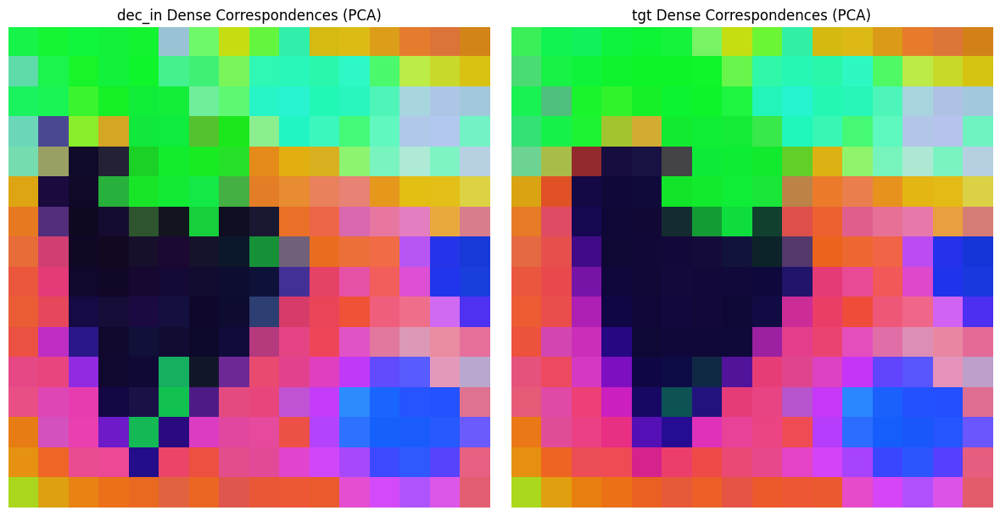

In [78]:
# 使用 PCA 将特征投影到颜色空间进行可视化（对齐 dense_sparse_matching.ipynb）

# 对齐 dense_sparse_matching.ipynb：使用所有 patch 进行 PCA 拟合
pca = PCA(n_components=3, whiten=True)
# 将特征从 [dim, H, W] 转换为 [H*W, dim] 用于 PCA
x_dec_in = dec_in_feats.view(dim, -1).permute(1, 0)  # [H*W, dim]
pca.fit(x_dec_in.detach().cpu().numpy())
# 为 dec_in 生成颜色（对齐 dense_sparse_matching.ipynb）
h_patches_dec_in = dec_in_feats.shape[1]
w_patches_dec_in = dec_in_feats.shape[2]
projected_dec_in = torch.from_numpy(
    pca.transform(x_dec_in.detach().cpu().numpy())
).view(h_patches_dec_in, w_patches_dec_in, 3)
# 使用 sigmoid 增强颜色对比度（对齐 dense_sparse_matching.ipynb）
projected_dec_in = F.sigmoid(projected_dec_in.mul(2.0)).permute(2, 0, 1)  # [3, H, W]


# 为 tgt 生成颜色（对齐 dense_sparse_matching.ipynb）
h_patches_tgt = tgt_feats.shape[1]
w_patches_tgt = tgt_feats.shape[2]
x_tgt = tgt_feats.view(dim, -1).permute(1, 0)  # [H*W, dim]
projected_tgt = torch.from_numpy(
    pca.transform(x_tgt.detach().cpu().numpy())
).view(h_patches_tgt, w_patches_tgt, 3)
projected_tgt = F.sigmoid(projected_tgt.mul(2.0)).permute(2, 0, 1)  # [3, H, W]

# 可视化 PCA 投影结果（对齐 dense_sparse_matching.ipynb）
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(projected_dec_in.permute(1, 2, 0).cpu().numpy())
axes[0].set_title("dec_in Dense Correspondences (PCA)", fontsize=12)
axes[0].axis('off')

axes[1].imshow(projected_tgt.permute(1, 2, 0).cpu().numpy())
axes[1].set_title("tgt Dense Correspondences (PCA)", fontsize=12)
axes[1].axis('off')
plt.tight_layout()
plt.show()
plt.close()


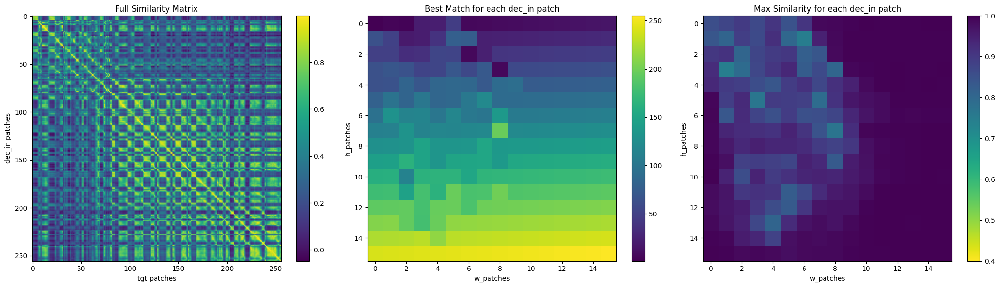

In [79]:
# 可视化相似度矩阵热图

# 将相似度矩阵 reshape 为 [H1*W1, H2*W2]，然后显示
similarity_np = similarity_matrix.detach().cpu().numpy()

# 创建热图
fig, axes = plt.subplots(1, 3, figsize=(21, 6))

# 1. 显示完整的相似度矩阵
im1 = axes[0].imshow(similarity_np, cmap='viridis', aspect='auto')
axes[0].set_title("Full Similarity Matrix", fontsize=12)
axes[0].set_xlabel("tgt patches")
axes[0].set_ylabel("dec_in patches")
plt.colorbar(im1, ax=axes[0])

# 2. 显示每个 dec_in patch 对应的最佳匹配（argmax）
best_matches = similarity_matrix.argmax(dim=1).cpu().numpy()  # [H1*W1]
best_matches_2d = best_matches.reshape(h_patches, w_patches)
# best_h = (best_matches // 14).reshape(h_patches, w_patches)   # 目标行坐标
# best_w = (best_matches %  14).reshape(h_patches, w_patches)   # 目标列坐标
# axes[3].imshow(best_h), axes[4].imshow(best_w)
im2 = axes[1].imshow(best_matches_2d, cmap='viridis', aspect='auto')
axes[1].set_title("Best Match for each dec_in patch", fontsize=12)
axes[1].set_xlabel("w_patches")
axes[1].set_ylabel("h_patches")
plt.colorbar(im2, ax=axes[1])

# 3. 显示每个 dec_in patch 的最大相似度值
max_similarities = similarity_matrix.max(dim=1).values.detach().cpu().numpy()  # [H1*W1]
max_sim_2d = max_similarities.reshape(h_patches, w_patches)
im3 = axes[2].imshow(max_sim_2d, cmap='viridis_r', aspect='auto',vmin=0.4,vmax=1)
axes[2].set_title("Max Similarity for each dec_in patch", fontsize=12)
axes[2].set_xlabel("w_patches")
axes[2].set_ylabel("h_patches")
plt.colorbar(im3, ax=axes[2])

plt.tight_layout()
plt.show()
plt.close()


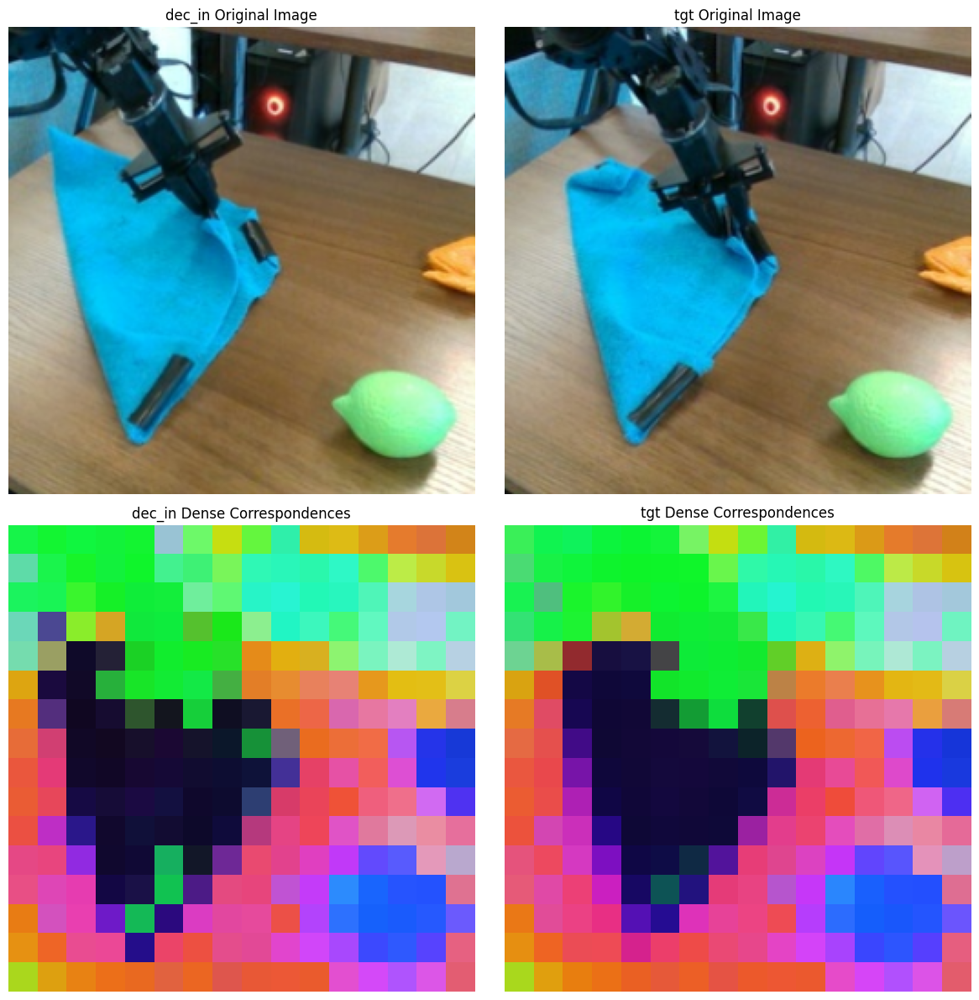

In [80]:
# 可视化原始图像和稠密相关性对比

# 获取原始图像（反归一化）
dec_in_img = denorm_for_vis(dec_in[index]).permute(1, 2, 0).cpu().numpy()
tgt_img = denorm_for_vis(tgt[index]).permute(1, 2, 0).cpu().numpy()
# 创建对比图
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# 第一行：原始图像
axes[0, 0].imshow(dec_in_img)
axes[0, 0].set_title("dec_in Original Image", fontsize=12)
axes[0, 0].axis('off')

# axes[0, 1].imshow(dec_in_img_1)
axes[0, 1].imshow(tgt_img)
axes[0, 1].set_title("tgt Original Image", fontsize=12)
axes[0, 1].axis('off')

# 第二行：PCA 投影的稠密相关性
axes[1, 0].imshow(projected_dec_in.permute(1, 2, 0).cpu().numpy())
axes[1, 0].set_title("dec_in Dense Correspondences", fontsize=12)
axes[1, 0].axis('off')

axes[1, 1].imshow(projected_tgt.permute(1, 2, 0).cpu().numpy())
# axes[1, 1].imshow(projected_dec_in_1.permute(1, 2, 0).cpu().numpy())
axes[1, 1].set_title("tgt Dense Correspondences", fontsize=12)
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()
plt.close()


torch.Size([768, 16, 16])


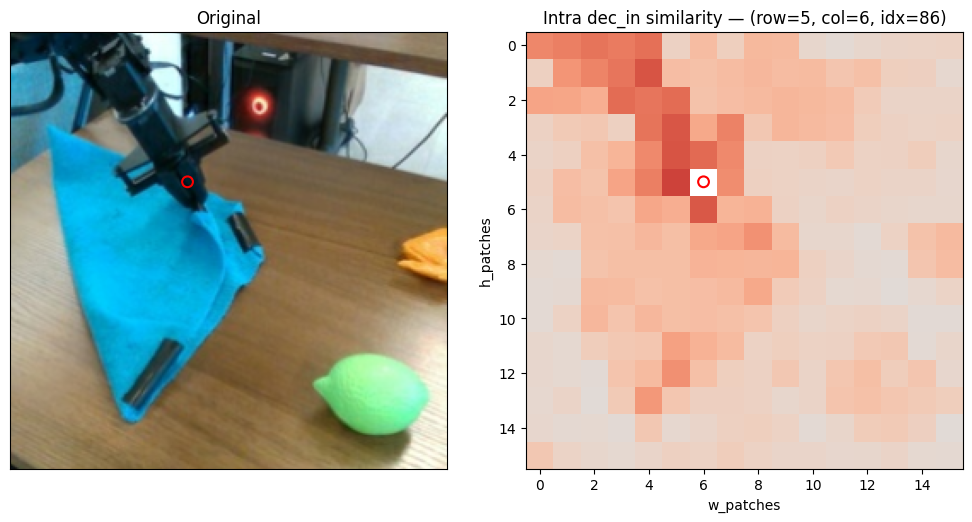

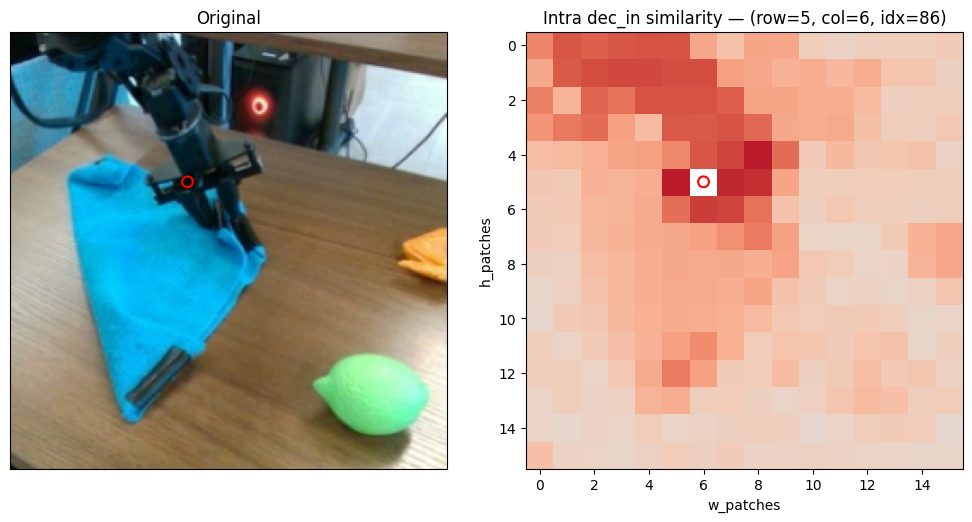

In [81]:
print(dec_in_feats.shape)
row=5
col=6
# sim = visualize_self_similarity(dec_in_feats, row=row, col=col, orig_image=tgt_img, mask_self=True, show_colorbar=True)
sim = visualize_self_similarity(dec_in_feats, row=row, col=col, orig_image=dec_in_img, mask_self=True, show_colorbar=False)
sim = visualize_self_similarity(tgt_feats, row=row, col=col, orig_image=tgt_img, mask_self=True, show_colorbar=False)

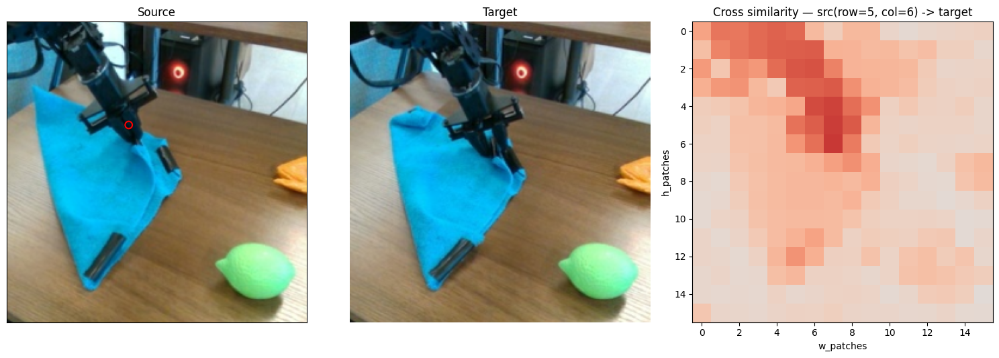

In [82]:
sim_cross = visualize_cross_image_similarity(
    src_feats=dec_in_feats,
    dst_feats=tgt_feats,
    src_row=row, src_col=col,
    src_image=dec_in_img,      # 可选
    dst_image=tgt_img,         # 可选
    overlay_on_dst=False,      # 若 True 则把热图叠加到目标原图上
    show_colorbar=False        # 默认 False
)


In [83]:
print(F.cosine_similarity(dec_in_feats,tgt_feats, dim=0).mean())
print(F.cosine_similarity(dec_in_dino[index],tgt_dino[index], dim=-1).mean())
print((dec_in_dino[index]-tgt_dino[index]).abs().mean())


tensor(0.8861, device='cuda:0')
tensor(0.8861, device='cuda:0')
tensor(0.2442, device='cuda:0')


In [42]:

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# 可视化 CLS token 与图像 patch 特征的相似度（同一图像）
# 需要 DINOv3Encoder.encode 支持 remove_cls=False
with torch.inference_mode():
    # 获取包含 CLS+register+patch 的完整 token 特征
    dec_all_tokens = lam.vision_encoder.encode(dec_in, remove_cls=False).squeeze(1)  # [B, 1+4+196, D]
    tgt_all_tokens = lam.vision_encoder.encode(tgt, remove_cls=False).squeeze(1)    # [B, 1+4+196, D]

# 选择一个样本索引
b = int(index)
# b=0
# 取出 CLS 与 patch tokens（DINO: 0 为 CLS，1-4 为 register，5: 开始为 patch）
dec_tokens_b = dec_all_tokens[b]  # [Tkn, D]
tgt_tokens_b = tgt_all_tokens[b]
cls_dec = F.normalize(dec_tokens_b[0], dim=-1)
cls_tgt = F.normalize(tgt_tokens_b[0], dim=-1)
patch_dec = F.normalize(dec_tokens_b[5:], dim=-1)  # [196, D]
patch_tgt = F.normalize(tgt_tokens_b[5:], dim=-1)  # [196, D]

# 计算 CLS 与 patch 的余弦相似度
sim_dec = F.cosine_similarity(cls_dec.unsqueeze(0), patch_dec, dim=-1)  # [196]
sim_tgt = F.cosine_similarity(cls_tgt.unsqueeze(0), patch_tgt, dim=-1)  # [196]

# 重塑为 14x14 热图（适配 224x224 / 16x16 patch）
h = w = int(patch_dec.shape[0] ** 0.5)
sim_dec_map = sim_dec.view(h, w).detach().cpu()
sim_tgt_map = sim_tgt.view(h, w).detach().cpu()

# 原图（反标准化到 [0,1]）
dec_img_np = denorm_for_vis(dec_in[b]).permute(1, 2, 0).cpu().numpy()
tgt_img_np = denorm_for_vis(tgt[b]).permute(1, 2, 0).cpu().numpy()

# 展示：原图 + 热力图（叠加）
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(dec_img_np)
axes[0, 0].set_title("dec_in 原图")
axes[0, 0].axis('off')
axes[0, 1].imshow(dec_img_np)
im0 = axes[0, 1].imshow(sim_dec_map.numpy(), cmap='viridis',  alpha=0.55)
axes[0, 1].set_title("CLS 与 dec_in patches 相似度")
axes[0, 1].axis('off')

axes[1, 0].imshow(tgt_img_np)
axes[1, 0].set_title("tgt 原图")
axes[1, 0].axis('off')
axes[1, 1].imshow(tgt_img_np)
im1 = axes[1, 1].imshow(sim_tgt_map.numpy(), cmap='viridis',  alpha=0.55)
axes[1, 1].set_title("CLS 与 tgt patches 相似度")
axes[1, 1].axis('off')

cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(im1, cax=cbar_ax, label='cosine similarity')
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()
plt.close()

print({
    'dec_in_cls_mean_sim': float(sim_dec.mean().cpu()),
    'dec_in_cls_min_sim': float(sim_dec.min().cpu()),
    'dec_in_cls_max_sim': float(sim_dec.max().cpu()),
    'tgt_cls_mean_sim': float(sim_tgt.mean().cpu()),
    'tgt_cls_min_sim': float(sim_tgt.min().cpu()),
    'tgt_cls_max_sim': float(sim_tgt.max().cpu()),
})

AssertionError: DINOv3Encoder 期望的 BN 层数为 1，但传入的特征层数为 4；请保证两者一致（通常为 len(latent_layer_to_use)）。

[23, 3, 16, 19, 25, 9, 2, 8, 23, 3, 4, 6, 26, 30, 15, 21, 10, 3, 20, 6, 17, 5, 18, 21, 13, 3, 27, 8, 13, 30, 16, 22, 26, 30, 16, 29, 17, 7, 20, 19, 0, 30, 4, 14, 17, 3, 16, 22, 25, 3, 20, 6, 10, 7, 18, 21, 23, 1, 27, 22, 25, 1, 18, 6, 26, 11, 18, 6, 13, 3, 27, 8, 26, 30, 31, 8, 13, 3, 16, 19, 13, 5, 2, 8, 25, 9, 2, 8, 17, 3, 15, 29, 23, 30, 24, 14, 10, 5, 24, 23, 26, 30, 16, 6, 23, 5, 27, 14, 25, 1, 27, 19, 25, 11, 12, 19, 13, 1, 24, 8, 23, 1, 24, 14, 0, 30, 12, 19, 23, 5, 12, 23, 25, 7, 27, 21, 23, 7, 2, 21, 10, 11, 4, 6, 0, 11, 2, 22, 25, 1, 16, 22, 23, 3, 16, 19, 26, 9, 18, 6, 0, 3, 27, 28, 17, 11, 31, 19, 23, 3, 20, 21, 25, 9, 2, 29, 23, 7, 27, 19, 17, 7, 20, 21, 10, 3, 16, 29, 23, 9, 27, 19, 17, 11, 15, 22, 25, 30, 20, 6, 26, 1, 16, 29, 26, 7, 27, 29, 25, 9, 12, 8, 26, 9, 2, 29, 13, 3, 20, 22, 10, 3, 24, 28, 25, 7, 2, 29, 10, 5, 15, 19, 17, 30, 15, 19, 25, 5, 16, 28, 26, 11, 2, 22, 17, 11, 20, 6, 13, 30, 27, 21, 10, 11, 16, 8, 25, 5, 2, 22, 13, 9, 2, 19, 0, 1, 16, 21, 25, 9, 27, 8

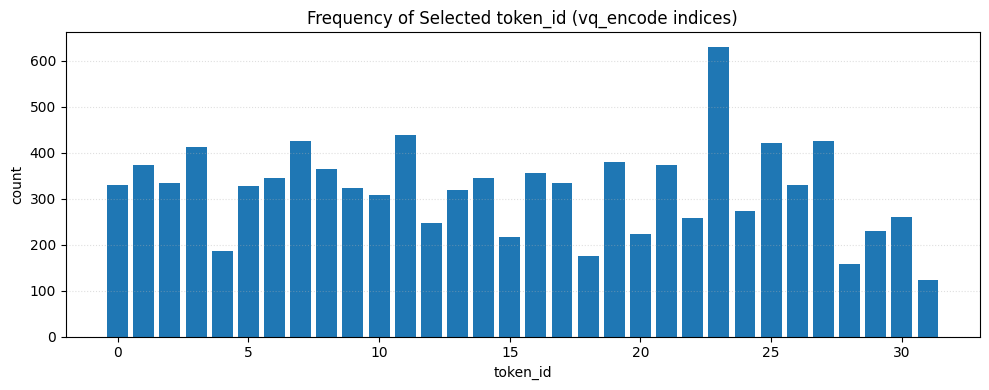

[0.         0.         0.00507813 0.99492187]


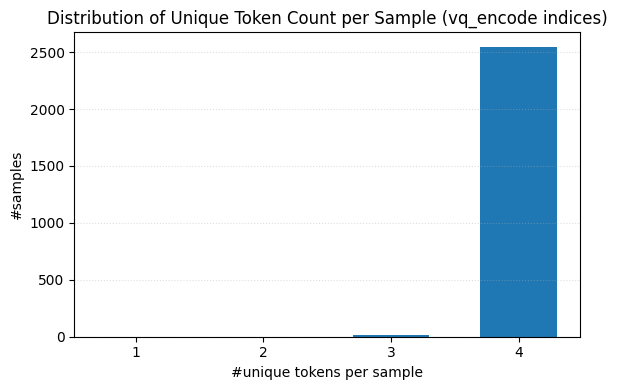

In-memory variables: all_selected_token_ids, per_sample_unique_counts


In [43]:
import torch
import numpy as np
import matplotlib.pyplot as plt

all_selected_token_ids = []
per_sample_unique_counts = []

# 遍历数据加载器，使用 lam.vq_encode 获取索引
num_iters = 20
iterator = iter(train_loader)

device = next(lam.parameters()).device

with torch.inference_mode():
    for i in range(num_iters):
        try:
            batch = next(iterator)
        except StopIteration:
            iterator = iter(train_loader)
            batch = next(iterator)

        videos = batch["videos"].to(device)
        states = (batch["states"] if "states" in batch else batch["proprio"]).to(device)
        # 与训练时保持一致，使用 dec_videos 作为解码输入
        dec_videos = batch["dec_videos"].to(device)

        # 正确调用 vq_encode：只传入 videos / states / dec_videos
        out = lam.vq_encode(videos, states, dec_videos=dec_videos, predict_future_frame=False)
        idx = out["indices"].detach().cpu().to(torch.long)  # [B, num_queries]

        # 统计所有 token id
        all_selected_token_ids.extend(idx.view(-1).tolist())

        # 每个样本的唯一 token 数
        per_sample_unique_counts.extend([int(torch.unique(row).numel()) for row in idx])

print(all_selected_token_ids)
print(per_sample_unique_counts)

# 图 1：对所有选取的 token_id 绘制统计（频次）图（仅显示，不保存）
if len(all_selected_token_ids) > 0:
    token_ids, counts = np.unique(np.asarray(all_selected_token_ids, dtype=np.int64), return_counts=True)
    plt.figure(figsize=(10, 4))
    plt.bar(token_ids.astype(int), counts.astype(int), width=0.8)
    plt.xlabel("token_id")
    plt.ylabel("count")
    plt.title("Frequency of Selected token_id (vq_encode indices)")
    plt.grid(axis="y", linestyle=":", alpha=0.4)
    plt.tight_layout()
    plt.show()
    plt.close()

# 图 2：绘制每个样本中出现了多少种 token 的分布（动态范围）（仅显示，不保存）
if len(per_sample_unique_counts) > 0:
    counts_arr = np.asarray(per_sample_unique_counts, dtype=int)
    max_k = int(counts_arr.max())
    xs = np.arange(1, max_k + 1, dtype=int)
    ys = np.array([(counts_arr == k).sum() for k in xs], dtype=int)
    denom = max(int(counts_arr.shape[0]), 1)
    print(ys / denom)
    plt.figure(figsize=(6, 4))
    plt.bar(xs, ys, width=0.6)
    plt.xticks(xs)
    plt.xlabel("#unique tokens per sample")
    plt.ylabel("#samples")
    plt.title("Distribution of Unique Token Count per Sample (vq_encode indices)")
    plt.grid(axis="y", linestyle=":", alpha=0.4)
    plt.tight_layout()
    plt.show()
    plt.close()

print("In-memory variables: all_selected_token_ids, per_sample_unique_counts")

In [44]:
import torch

# 量化器最近邻边界敏感度：nearest vs 2nd-nearest 距离间隔（margin）
with torch.inference_mode():
    device = next(lam.parameters()).device
    videos_d = videos.to(device)
    states_d = states.to(device)
    dec_videos_d = dec_videos.to(device)

    # 复用 LAM 的视觉编码 + 编码器，获取 nodes（未量化前的查询向量）
    T = videos_d.shape[1]
    cat_videos = torch.cat([videos_d, dec_videos_d], dim=1)
    all_features = lam.vision_encoder.encode(
        cat_videos,
        n=lam.latent_layer_to_use,
    )
    if isinstance(lam.latent_layer_to_use, (list, tuple)) and isinstance(all_features, (list, tuple)):
        dec_feats = all_features[-1]
        if lam.multi_input and len(lam.latent_layer_to_use) >= 2:
            enc_feats = torch.cat([all_features[0], all_features[-1]], dim=-1)
        else:
            enc_feats = all_features[0]
    else:
        enc_feats = dec_feats = all_features

    enc_in = enc_feats[:, :T]
    nodes = lam.encoder(enc_in, states_d)  # [B, num_queries, code_dim]

    codebook = lam.vq.get_codebooks()  # [K, D]
    nodes_flat = nodes.float().reshape(-1, nodes.shape[-1])  # [B*Q, D]

    # 欧氏距离的前两名，用于 margin=dist2-dist1
    nodes_norm = (nodes_flat * nodes_flat).sum(dim=-1, keepdim=True)               # [B*Q, 1]
    code_norm = (codebook * codebook).sum(dim=-1).unsqueeze(0)                    # [1, K]
    dist = nodes_norm + code_norm - 2.0 * nodes_flat @ codebook.t()               # [B*Q, K]
    dist = dist.clamp_min(0.0)

    top2 = dist.topk(k=2, largest=False, dim=1)                                   # nearest & 2nd nearest
    margin = top2.values[:, 1] - top2.values[:, 0]                                # [B*Q]
    margin_slot = margin.view(*nodes.shape[:2])                                   # [B, Q]

    print(
        "margin stats (2nd - 1st distance):",
        f"mean={margin.mean().item():.6f}",
        f"min={margin.min().item():.6f}",
        f"max={margin.max().item():.6f}",
    )
    print("per-slot mean margin:", margin_slot.mean(dim=0).cpu().numpy())



RuntimeError: mat1 and mat2 shapes cannot be multiplied (512x768 and 64x32)